In [3]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
#from astropy.nddata import Cutout2D
from astropy import units as u
#from astropy.coordinates import SkyCoord
from astropy import wcs
#from astropy.wcs.utils import pixel_to_skycoord
import pandas as pd
#from astropy.table import Table
import numpy.ma as ma
from time import strftime, localtime

In [2]:
path='/home/bruno/Documents/COSMOamautas/Data/Bootes/'

In [13]:
hdu_list = fits.open(path+'Maps/BO_image_full_ampphase_di_m.NS_shift.int.facetRestored.blanked.scaled-crop.fits',memmap=True)
print(hdu_list.info())

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BO_image_full_ampphase_di_m.NS_shift.int.facetRestored.blanked.scaled-crop.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     269   (19845, 19845, 1, 1)   float32   
None


In [6]:
hdu_list[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    4 / number of array dimensions                     
NAXIS1  =                19845                                                  
NAXIS2  =                19845                                                  
NAXIS3  =                    1                                                  
NAXIS4  =                    1                                                  
WCSAXES =                    4 / Number of coordinate axes                      
CRPIX1  =               9923.0 / Pixel coordinate of reference point            
CRPIX2  =               9923.0 / Pixel coordinate of reference point            
CRPIX3  =                  1.0 / Pixel coordinate of reference point            
CRPIX4  =                  1.0 / Pixel coordinate of reference point            
CDELT1  = -0.000416666666666

In [14]:
print('Unit: ',hdu_list[0].header['BUNIT'])
lofar_pixscale = hdu_list[0].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',lofar_pixscale)

im_data = hdu_list[0].data[0][0]
hdu_list.close()

Unit:  Jy/beam
Pixscale:  1.500000000000012


In [3]:
hdu_list = fits.open(path+'Maps/bootes_radio_rms_image.fits',memmap=True)
print(hdu_list.info())

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/bootes_radio_rms_image.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      36   (19845, 19845, 1, 1)   float32   
None


In [10]:
hdu_list[0].header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    4 / number of array dimensions                     
NAXIS1  =                19845                                                  
NAXIS2  =                19845                                                  
NAXIS3  =                    1                                                  
NAXIS4  =                    1                                                  
EXTEND  =                    T                                                  
CRVAL1  =                218.0                                                  
CDELT1  = -0.00041666666666667                                                  
CRPIX1  =               9923.0                                                  
CUNIT1  = 'deg     '                                                            
CTYPE1  = 'RA---SIN'        

In [5]:
lofar_pixscale = hdu_list[0].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',lofar_pixscale)

im_error = hdu_list[0].data[0][0]
hdu_list.close()

Pixscale:  1.500000000000012


In [6]:
np.nanmin(im_error)

3.277825e-05

In [7]:
np.nanmean(im_error)

6.617687e-05

In [ ]:
l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

KeyboardInterrupt: 

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/HerMES_PACS_level5_Bootes_HerMES_100um_EdoIbar_Unimap.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  IMAGE         1 ImageHDU        77   (4143, 4183)   float32   
  2  ERROR         1 ImageHDU        77   (4143, 4183)   float32   
  3  COVERAGE      1 ImageHDU        72   (4143, 4183)   float32   
  4  Mask          1 ImageHDU        77   (1035, 1045)   int16   
None
Unit:  Jy/pix
Pixscale:  2.0000000484


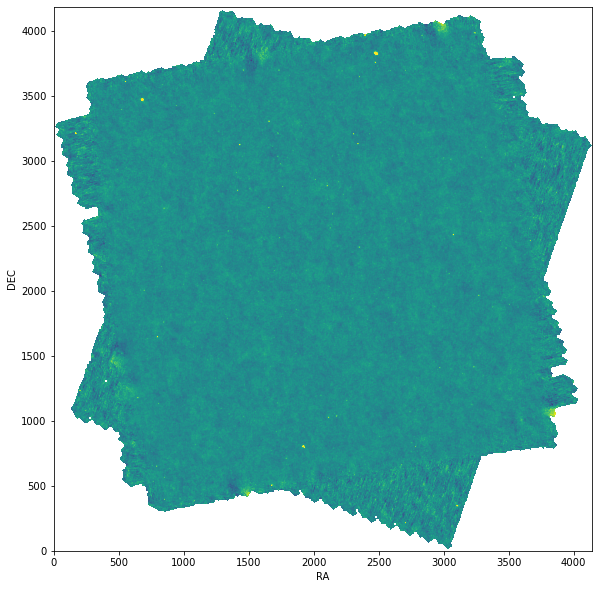

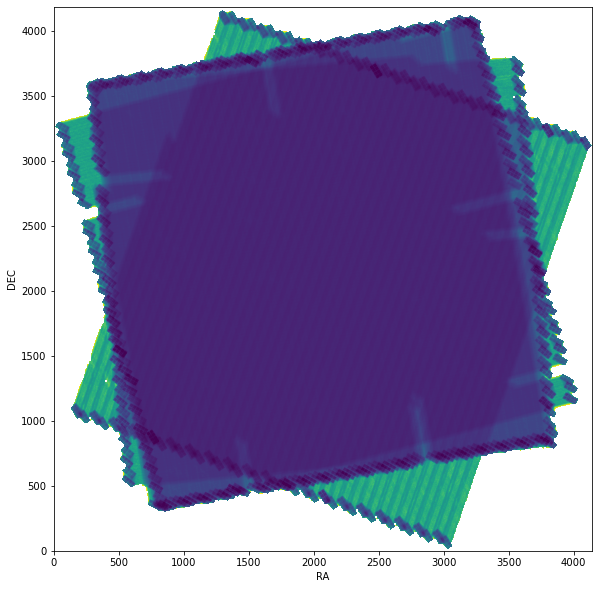

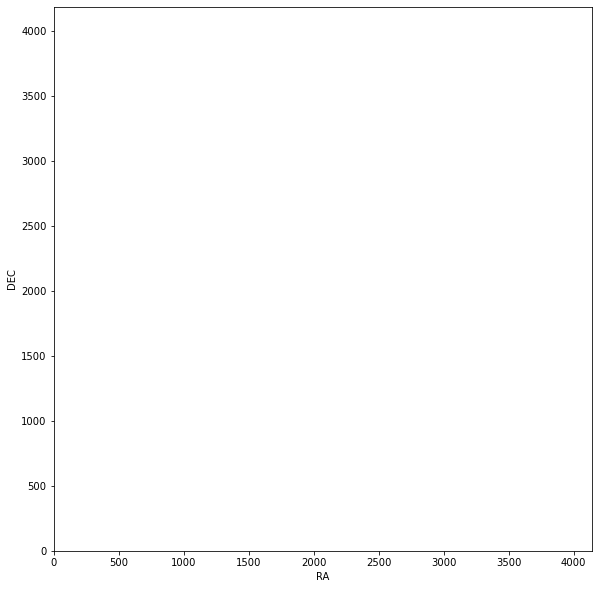

-0.088591084
0.0011491822
0.97139394
0.97139394
3.8440474e-05
0.0033563988


In [3]:
hdu_list = fits.open(path+'Maps/HerMES_PACS_level5_Bootes_HerMES_100um_EdoIbar_Unimap.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
pacs_100_hermes_pixscale = hdu_list[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',pacs_100_hermes_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_100_hermes_min = np.nanmin(im_data)
print(origin_100_hermes_min)
detected_100_hermes_min = np.nanmin(detected.filled(np.nan))
print(detected_100_hermes_min)

origin_100_hermes_max = np.nanmax(im_data)
print(origin_100_hermes_max)
detected_100_hermes_max = np.nanmax(detected.filled(np.nan))
print(detected_100_hermes_max)

origin_100_hermes_mean = np.nanmean(im_data)
print(origin_100_hermes_mean)
detected_100_hermes_mean = np.nanmean(detected.filled(np.nan))
print(detected_100_hermes_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/HerMES_PACS_level5_Bootes_HerMES_160um_EdoIbar_Unimap.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  IMAGE         1 ImageHDU        42   (2762, 2787)   float32   
  2  ERROR         1 ImageHDU        42   (2762, 2787)   float32   
  3  COVERAGE      1 ImageHDU        37   (2762, 2787)   float32   
  4  Mask          1 ImageHDU        42   (690, 696)   int16   
None
Unit:  Jy/pix
Pixscale:  3.0000000726000002


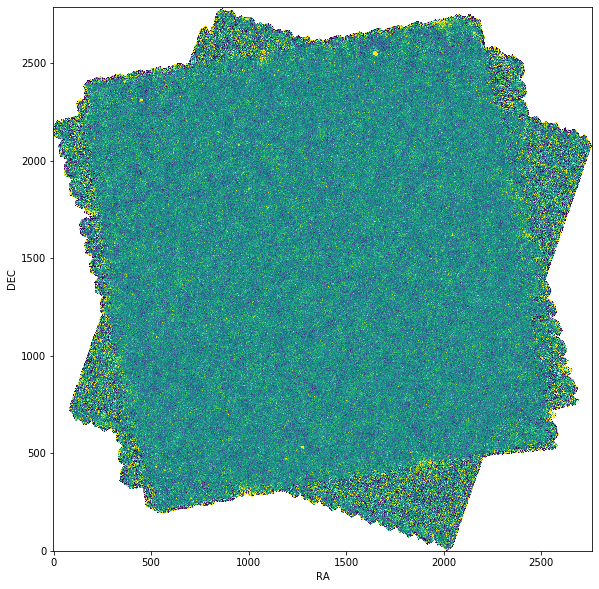

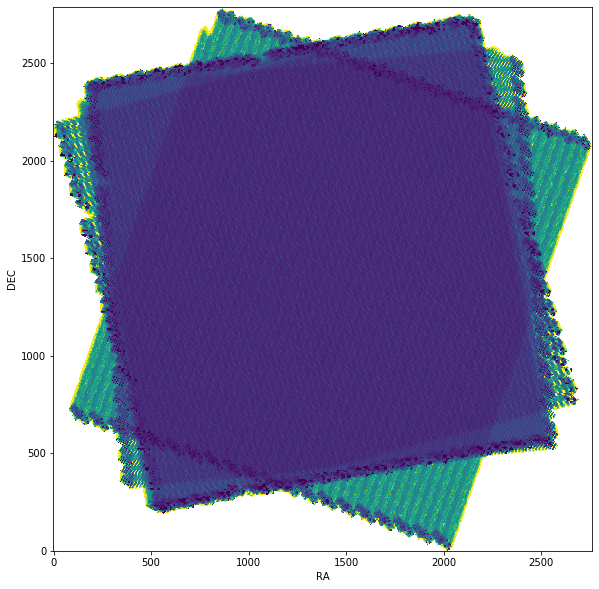

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


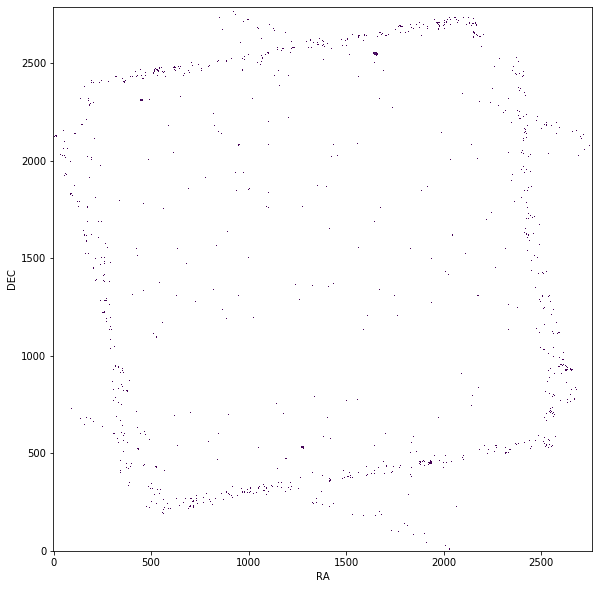

-0.033005286
0.0013363721
0.9704836
0.9704836
0.00010145528
0.0050483695


In [10]:
hdu_list = fits.open(path+'Maps/HerMES_PACS_level5_Bootes_HerMES_160um_EdoIbar_Unimap.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
pacs_160_hermes_pixscale = hdu_list[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',pacs_160_hermes_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_160_hermes_min = np.nanmin(im_data)
print(origin_160_hermes_min)
detected_160_hermes_min = np.nanmin(detected.filled(np.nan))
print(detected_160_hermes_min)

origin_160_hermes_max = np.nanmax(im_data)
print(origin_160_hermes_max)
detected_160_hermes_max = np.nanmax(detected.filled(np.nan))
print(detected_160_hermes_max)

origin_160_hermes_mean = np.nanmean(im_data)
print(origin_160_hermes_mean)
detected_160_hermes_mean = np.nanmean(detected.filled(np.nan))
print(detected_160_hermes_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/HerMES_PACS_level6_Bootes_NDWFS_100um_EdoIbar_Unimap.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  IMAGE         1 ImageHDU        82   (6683, 6868)   float32   
  2  ERROR         1 ImageHDU        82   (6683, 6868)   float32   
  3  COVERAGE      1 ImageHDU        77   (6683, 6868)   float32   
  4  Mask          1 ImageHDU        82   (1670, 1717)   int16   
None
Unit:  Jy/pix
Pixscale:  2.0000000484


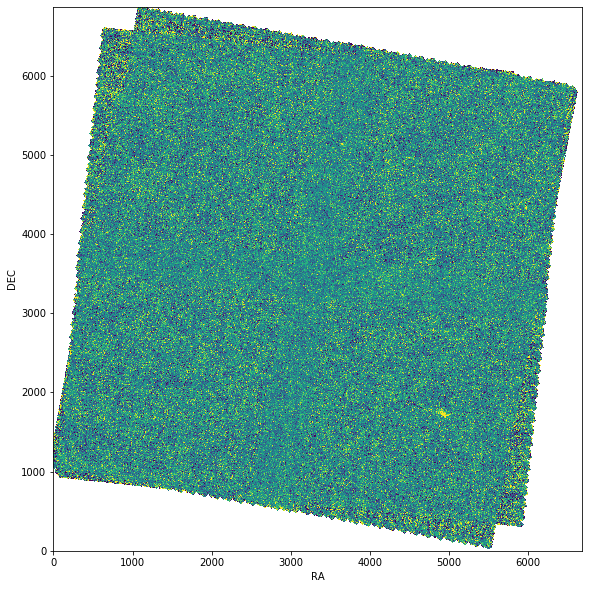

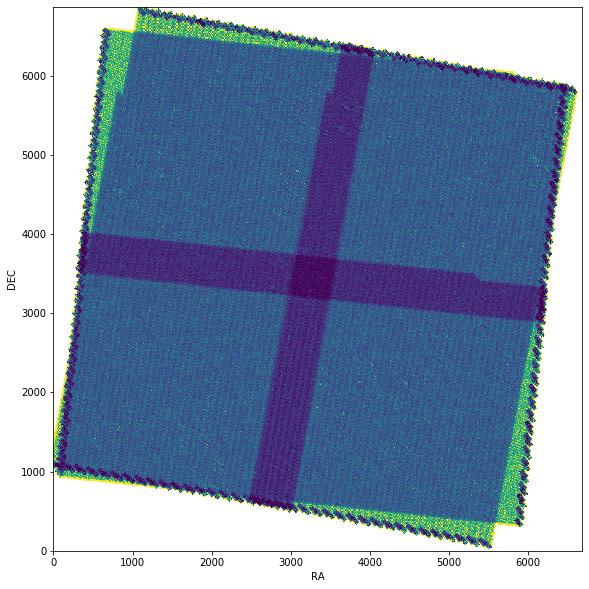

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


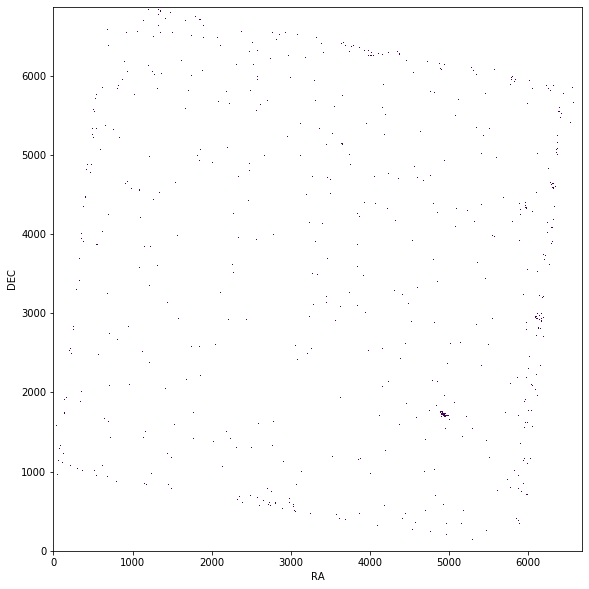

-0.09077273
0.0009062005
0.48351285
0.48351285
1.4272526e-06
0.003973289


In [11]:
hdu_list = fits.open(path+'Maps/HerMES_PACS_level6_Bootes_NDWFS_100um_EdoIbar_Unimap.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
pacs_100_ndwfs_pixscale = hdu_list[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',pacs_100_ndwfs_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_100_ndwfs_min = np.nanmin(im_data)
print(origin_100_ndwfs_min)
detected_100_ndwfs_min = np.nanmin(detected.filled(np.nan))
print(detected_100_ndwfs_min)

origin_100_ndwfs_max = np.nanmax(im_data)
print(origin_100_ndwfs_max)
detected_100_ndwfs_max = np.nanmax(detected.filled(np.nan))
print(detected_100_ndwfs_max)

origin_100_ndwfs_mean = np.nanmean(im_data)
print(origin_100_ndwfs_mean)
detected_100_ndwfs_mean = np.nanmean(detected.filled(np.nan))
print(detected_100_ndwfs_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/HerMES_PACS_level6_Bootes_NDWFS_160um_EdoIbar_Unimap.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1  IMAGE         1 ImageHDU        42   (4456, 4576)   float32   
  2  ERROR         1 ImageHDU        42   (4456, 4576)   float32   
  3  COVERAGE      1 ImageHDU        37   (4456, 4576)   float32   
  4  Mask          1 ImageHDU        39   (1114, 1144)   int16   
None
Unit:  Jy/pix
Pixscale:  3.0000000726000002


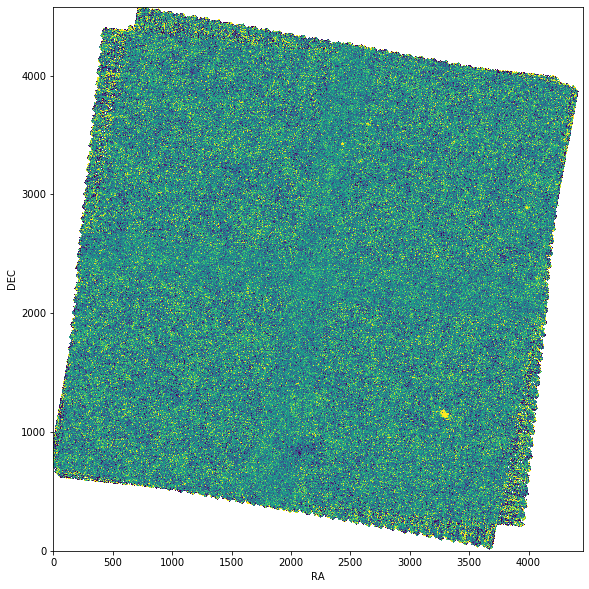

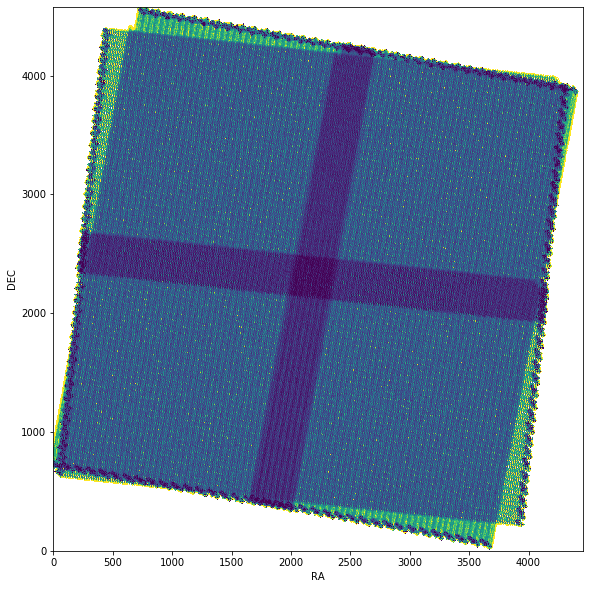

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


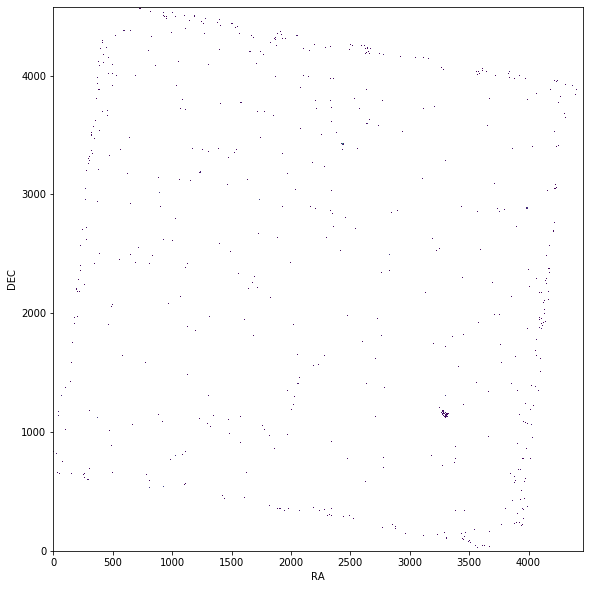

-0.035713326
0.0010422856
0.12982355
0.12982355
1.3911399e-06
0.006015545


In [12]:
hdu_list = fits.open(path+'Maps/HerMES_PACS_level6_Bootes_NDWFS_160um_EdoIbar_Unimap.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
pacs_160_ndwfs_pixscale = hdu_list[1].header['CDELT2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',pacs_160_ndwfs_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_160_ndwfs_min = np.nanmin(im_data)
print(origin_160_ndwfs_min)
detected_160_ndwfs_min = np.nanmin(detected.filled(np.nan))
print(detected_160_ndwfs_min)

origin_160_ndwfs_max = np.nanmax(im_data)
print(origin_160_ndwfs_max)
detected_160_ndwfs_max = np.nanmax(detected.filled(np.nan))
print(detected_160_ndwfs_max)

origin_160_ndwfs_mean = np.nanmean(im_data)
print(origin_160_ndwfs_mean)
detected_160_ndwfs_mean = np.nanmean(detected.filled(np.nan))
print(detected_160_ndwfs_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BOOTES-HerMES-NEST_image_250_SMAP_v6.0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      79   ()      
  1  image         1 ImageHDU        93   (2315, 2354)   float64   
  2  error         1 ImageHDU        93   (2315, 2354)   float64   
  3  exposure      1 ImageHDU        92   (2315, 2354)   float64   
  4  flag          1 ImageHDU        95   (2315, 2354)   int32   
None
Unit:  Jy / beam
Pixscale:  6.000000145272001


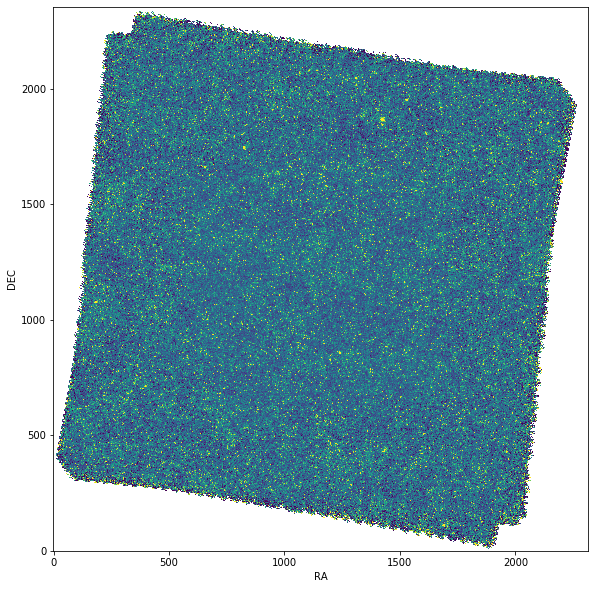

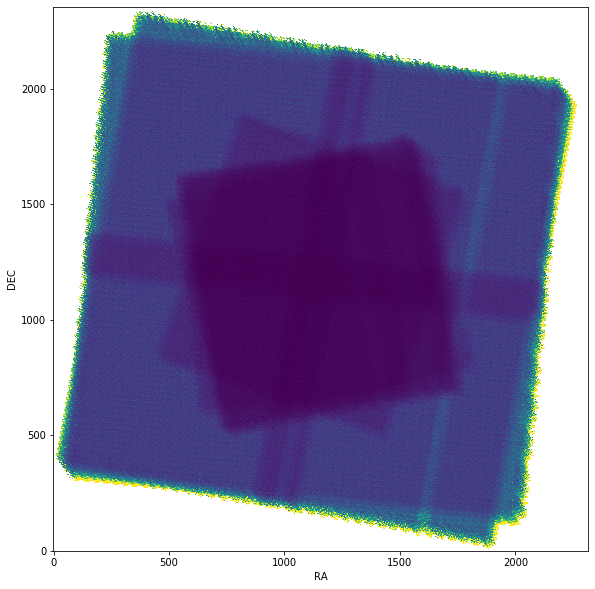

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


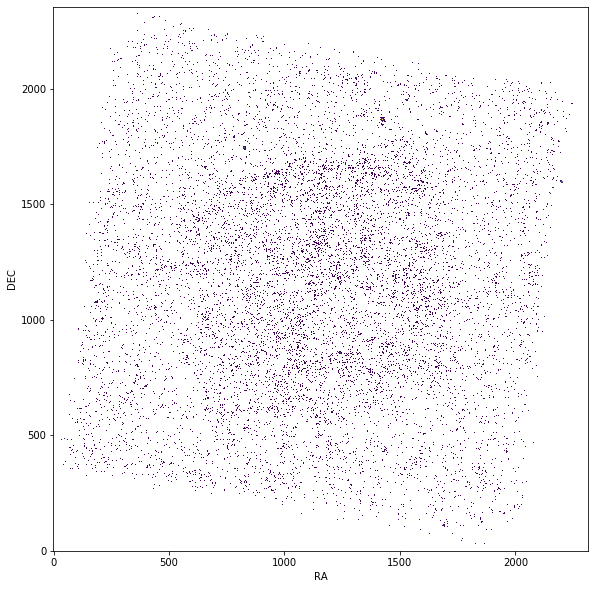

-0.2816619736971862
0.007228170760850268
1.6573219048143888
1.6573219048143888
1.8400561300392302e-06
0.021531143850906605


In [13]:
hdu_list = fits.open(path+'Maps/BOOTES-HerMES-NEST_image_250_SMAP_v6.0.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
spire_250_pixscale = hdu_list[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',spire_250_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_250_min = np.nanmin(im_data)
print(origin_250_min)
detected_250_min = np.nanmin(detected.filled(np.nan))
print(detected_250_min)

origin_250_max = np.nanmax(im_data)
print(origin_250_max)
detected_250_max = np.nanmax(detected.filled(np.nan))
print(detected_250_max)

origin_250_mean = np.nanmean(im_data)
print(origin_250_mean)
detected_250_mean = np.nanmean(detected.filled(np.nan))
print(detected_250_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BOOTES-HerMES-NEST_image_350_SMAP_v6.0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      79   ()      
  1  image         1 ImageHDU        93   (1667, 1695)   float64   
  2  error         1 ImageHDU        93   (1667, 1695)   float64   
  3  exposure      1 ImageHDU        92   (1667, 1695)   float64   
  4  flag          1 ImageHDU        95   (1667, 1695)   int32   
None
Unit:  Jy / beam
Pixscale:  8.333333395416


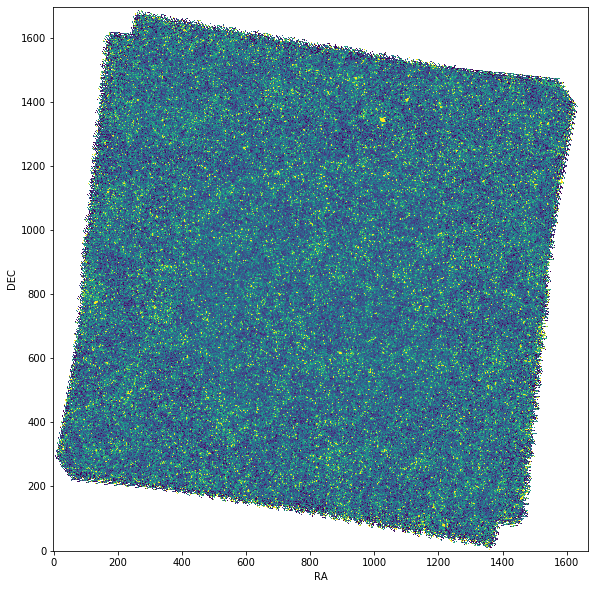

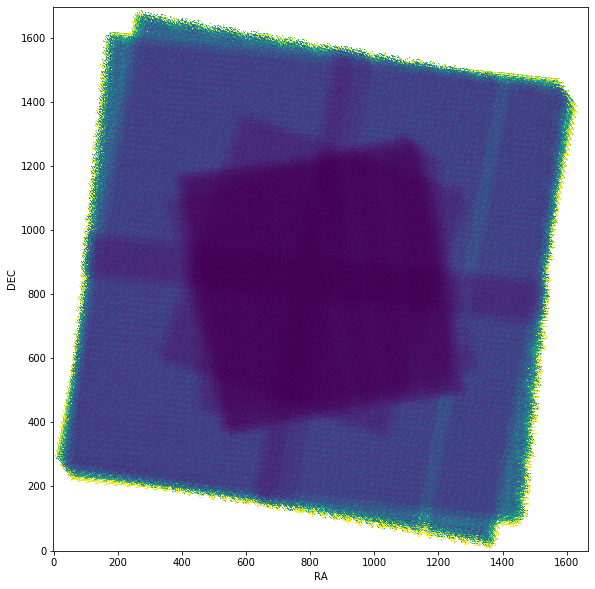

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


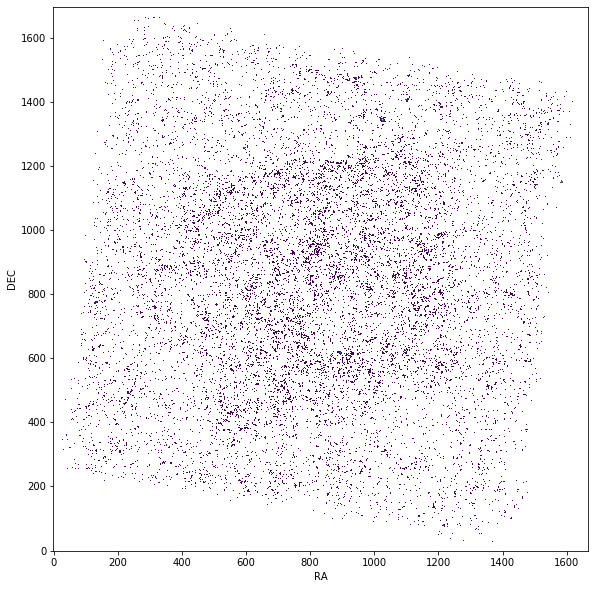

-0.13964165062106437
0.0073183599390681245
0.8707851601705123
0.8707851601705123
-1.6272148383494198e-05
0.01995076680847613


In [14]:
hdu_list = fits.open(path+'Maps/BOOTES-HerMES-NEST_image_350_SMAP_v6.0.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
spire_350_pixscale = hdu_list[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',spire_350_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_350_min = np.nanmin(im_data)
print(origin_350_min)
detected_350_min = np.nanmin(detected.filled(np.nan))
print(detected_350_min)

origin_350_max = np.nanmax(im_data)
print(origin_350_max)
detected_350_max = np.nanmax(detected.filled(np.nan))
print(detected_350_max)

origin_350_mean = np.nanmean(im_data)
print(origin_350_mean)
detected_350_mean = np.nanmean(detected.filled(np.nan))
print(detected_350_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      79   ()      
  1  image         1 ImageHDU        93   (1159, 1177)   float64   
  2  error         1 ImageHDU        93   (1159, 1177)   float64   
  3  exposure      1 ImageHDU        92   (1159, 1177)   float64   
  4  flag          1 ImageHDU        95   (1159, 1177)   int32   
None
Unit:  Jy / beam
Pixscale:  12.00000029058


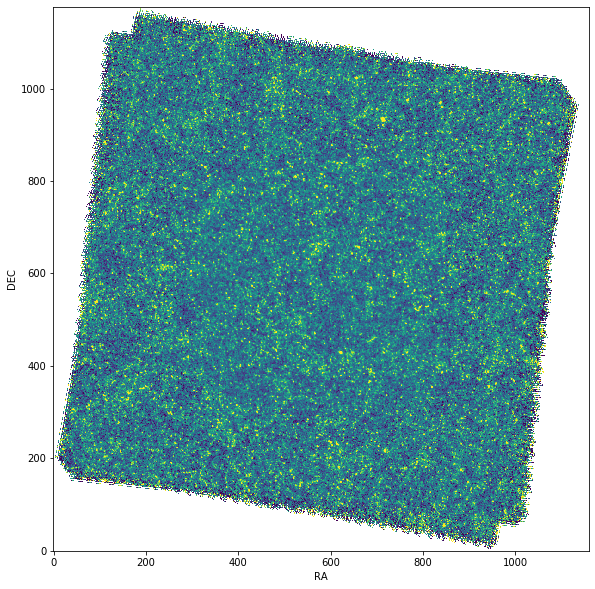

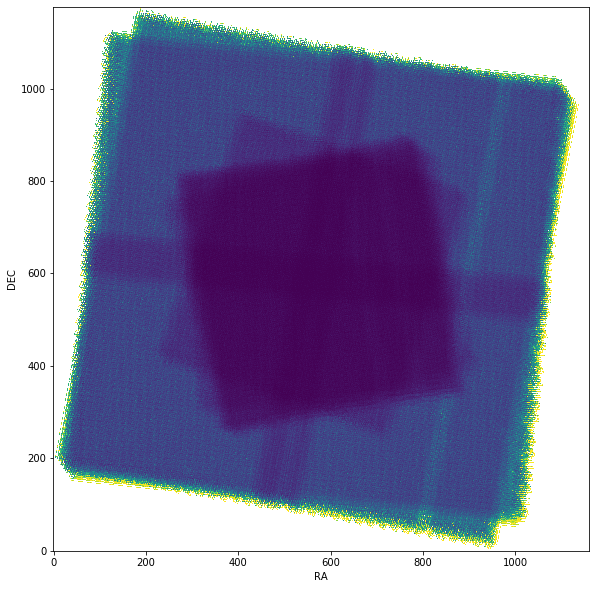

/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: RuntimeWarning: invalid value encountered in greater_equal


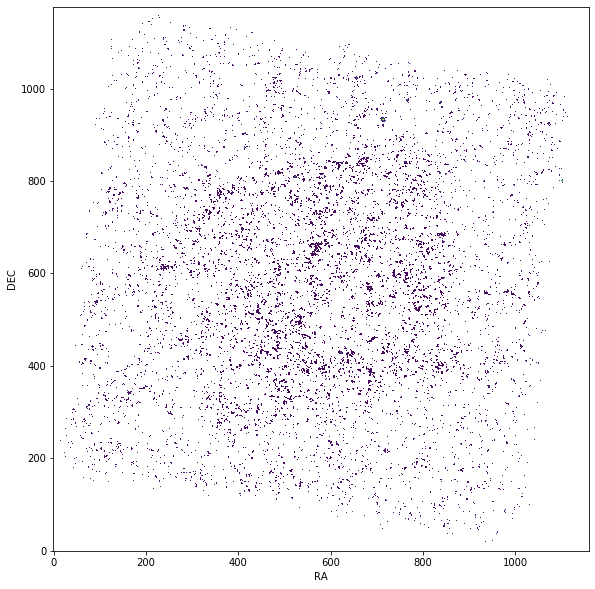

-0.33834048247290754
0.008306016149491606
0.4245068759856556
0.4245068759856556
-5.035589073885998e-06
0.02056388141944693


In [15]:
hdu_list = fits.open(path+'Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
spire_500_pixscale = hdu_list[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',spire_500_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_500_min = np.nanmin(im_data)
print(origin_500_min)
detected_500_min = np.nanmin(detected.filled(np.nan))
print(detected_500_min)

origin_500_max = np.nanmax(im_data)
print(origin_500_max)
detected_500_max = np.nanmax(detected.filled(np.nan))
print(detected_500_max)

origin_500_mean = np.nanmean(im_data)
print(origin_500_mean)
detected_500_mean = np.nanmean(detected.filled(np.nan))
print(detected_500_mean)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      79   ()      
  1  image         1 ImageHDU        93   (1159, 1177)   float64   
  2  error         1 ImageHDU        93   (1159, 1177)   float64   
  3  exposure      1 ImageHDU        92   (1159, 1177)   float64   
  4  flag          1 ImageHDU        95   (1159, 1177)   int32   
None
Unit:  Jy / beam
Pixscale:  12.00000029058


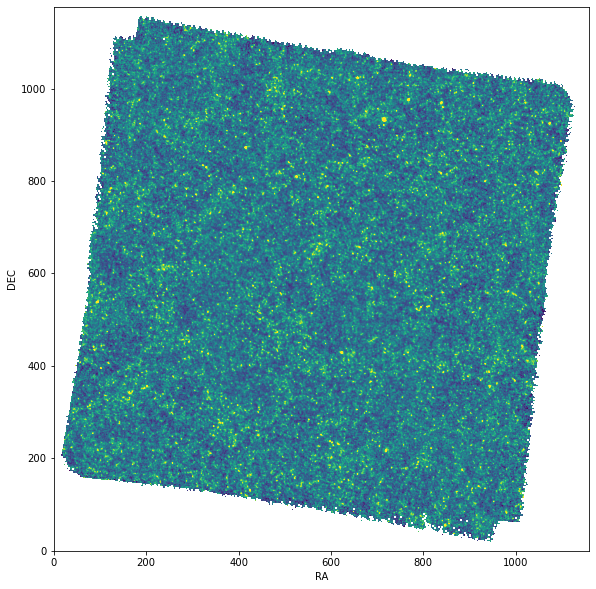

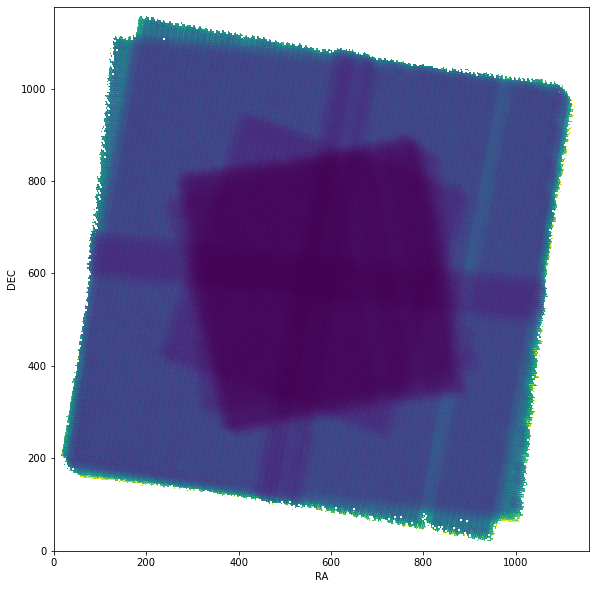

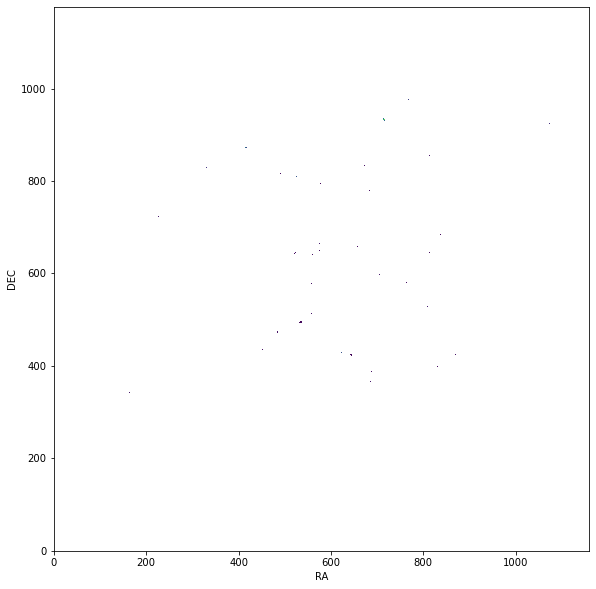

-0.33834048247290754
0.008306016149491606
0.4245068759856556
0.4245068759856556
-5.035589073885998e-06
0.02056388141944693
0.009995454244567813
0.006766226134984318


In [6]:
hdu_list = fits.open(path+'Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
spire_500_pixscale = hdu_list[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',spire_500_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_500_min = np.nanmin(im_data)
print(origin_500_min)
detected_500_min = np.nanmin(detected.filled(np.nan))
print(detected_500_min)

origin_500_max = np.nanmax(im_data)
print(origin_500_max)
detected_500_max = np.nanmax(detected.filled(np.nan))
print(detected_500_max)

origin_500_mean = np.nanmean(im_data)
print(origin_500_mean)
detected_500_mean = np.nanmean(detected.filled(np.nan))
print(detected_500_mean)

signal_500_rms = np.sqrt(np.nanmean(im_data**2))
print(signal_500_rms)
noise_500_rms = np.sqrt(np.nanmean(im_error**2))
print(noise_500_rms)

del im_data
del im_error
del im_ratio
del detected

Filename: /home/bruno/Documents/COSMOamautas/Data/Bootes/Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      79   ()      
  1  image         1 ImageHDU        93   (1159, 1177)   float64   
  2  error         1 ImageHDU        93   (1159, 1177)   float64   
  3  exposure      1 ImageHDU        92   (1159, 1177)   float64   
  4  flag          1 ImageHDU        95   (1159, 1177)   int32   
None
Unit:  Jy / beam
Pixscale:  12.00000029058


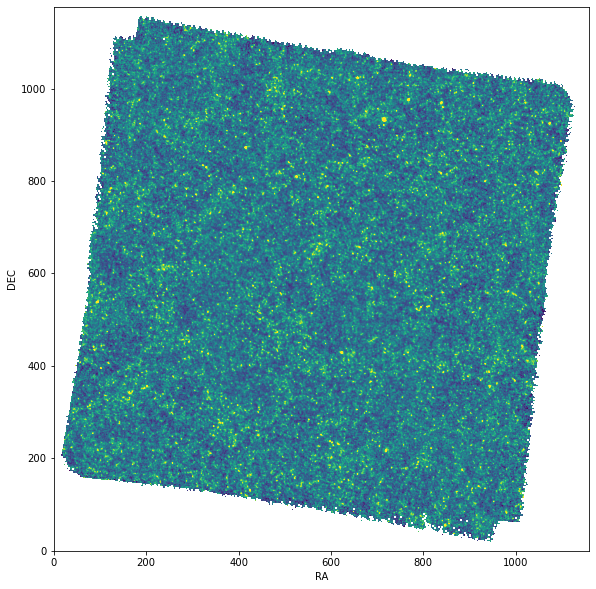

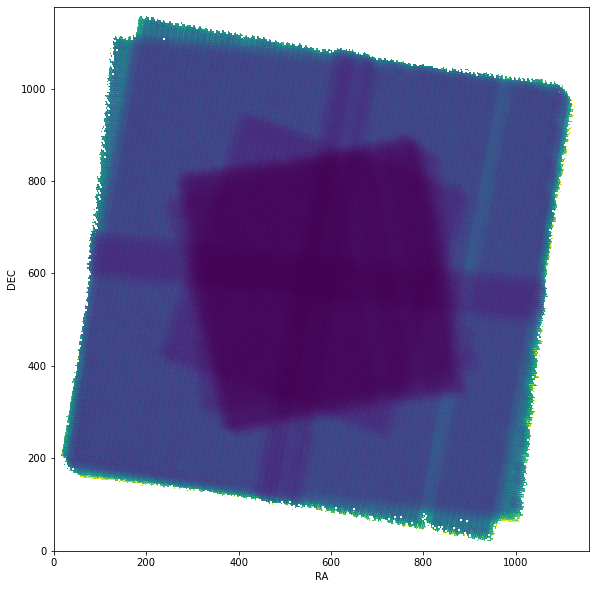

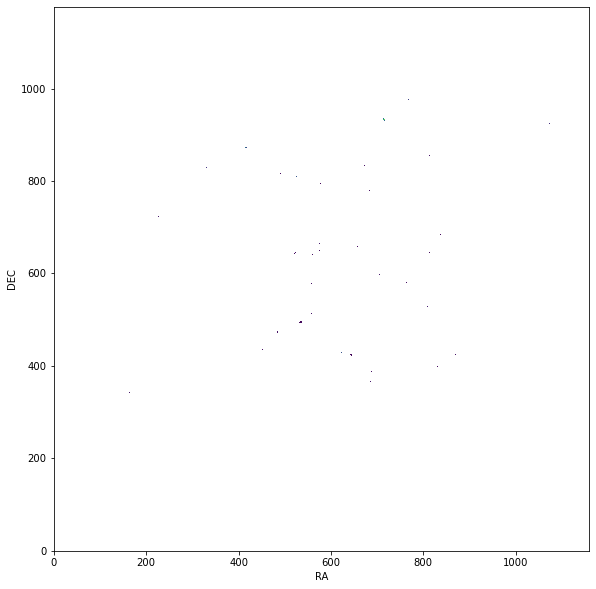

-0.33834048247290754
0.008306016149491606
0.4245068759856556
0.4245068759856556
-5.035589073885998e-06
0.02056388141944693
0.009995454244567813
0.006766226134984318


In [6]:
hdu_list = fits.open(path+'Maps/BOOTES-HerMES-NEST_image_500_SMAP_v6.0.fits',memmap=True)
print(hdu_list.info())

print('Unit: ',hdu_list[1].header['BUNIT'])
spire_500_pixscale = hdu_list[1].header['CD2_2']*3600 # PIXEL SCALE IN ARCSEC
print('Pixscale: ',spire_500_pixscale)

im_data = hdu_list[1].data
im_error = hdu_list[2].data
hdu_list.close()

l_lim_data = np.nanpercentile(im_data,1)
u_lim_data = np.nanpercentile(im_data,99)
l_lim_error = np.nanpercentile(im_error,1)
u_lim_error = np.nanpercentile(im_error,99)

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_data,origin='lower',clim=(l_lim_data,u_lim_data))
plt.show()

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(im_error,origin='lower',clim=(l_lim_error,u_lim_error))
plt.show()

im_ratio = im_data/im_error
detected = ma.array(im_data, mask=~(im_ratio>=3))

fig, ax = plt.subplots(figsize=(10,10))
ax.set_xlabel('RA')
ax.set_ylabel('DEC')
ax.imshow(detected.filled(np.nan),origin='lower')
plt.show()

origin_500_min = np.nanmin(im_data)
print(origin_500_min)
detected_500_min = np.nanmin(detected.filled(np.nan))
print(detected_500_min)

origin_500_max = np.nanmax(im_data)
print(origin_500_max)
detected_500_max = np.nanmax(detected.filled(np.nan))
print(detected_500_max)

origin_500_mean = np.nanmean(im_data)
print(origin_500_mean)
detected_500_mean = np.nanmean(detected.filled(np.nan))
print(detected_500_mean)

signal_500_rms = np.sqrt(np.nanmean(im_data**2))
print(signal_500_rms)
noise_500_rms = np.sqrt(np.nanmean(im_error**2))
print(noise_500_rms)

del im_data
del im_error
del im_ratio
del detected

In [26]:
fluxes_table = pd.DataFrame({"pacs_100_pix":[detected_100_hermes_min*1000,detected_100_ndwfs_min*1000,detected_100_hermes_mean*1000,detected_100_ndwfs_mean*1000],
                             "pacs_160_pix":[detected_160_hermes_min*1000,detected_160_ndwfs_min*1000,detected_160_hermes_mean*1000,detected_160_ndwfs_mean*1000],
                             "spire_250_beam":[detected_250_min*1000,detected_250_min*1000,detected_250_mean*1000,detected_250_mean*1000],
                             "spire_350_beam":[detected_350_min*1000,detected_350_min*1000,detected_350_mean*1000,detected_350_mean*1000],
                             "spire_500_beam":[detected_500_min*1000,detected_500_min*1000,detected_500_mean*1000,detected_500_mean*1000]})
fluxes_table

,pacs_100_pix,pacs_160_pix,spire_250_beam,spire_350_beam,spire_500_beam
0,1.149182,1.336372,7.228171,7.318360,8.306016
1,0.906200,1.042286,7.228171,7.318360,8.306016
2,3.356399,5.048370,21.531144,19.950767,20.563881
3,3.973289,6.015545,21.531144,19.950767,20.563881


In [28]:
FWHM_100 = 6.8 # beam FWHM in arcsec
FWHM_160 = 11.0
FWHM_250 = 18.2
FWHM_350 = 24.9
FWHM_500 = 36.3

In [29]:
pixarea = pacs_100_ndwfs_pixscale**2 # pixel area in arcsec^2/pixel
beamarea = np.pi*((FWHM_100**2)/(4*np.log(2))) # beam area in arcsec^2/beam
fluxes_table['pacs_100_beam'] = fluxes_table['pacs_100_pix']*beamarea/pixarea # converting to Jy/beam

In [30]:
pixarea = pacs_160_ndwfs_pixscale**2 # pixel area in arcsec^2/pixel
beamarea = np.pi*((FWHM_160**2)/(4*np.log(2))) # beam area in arcsec^2/beam
fluxes_table['pacs_160_beam'] = fluxes_table['pacs_160_pix']*beamarea/pixarea # converting to Jy/beam

In [45]:
fluxes_table = fluxes_table.append(pd.DataFrame({"pacs_100_beam":[0.8],
                                  "pacs_160_beam":[2.4],
                                  "spire_250_beam":[7.0],
                                  "spire_350_beam":[7.5],
                                  "spire_500_beam":[13]}),ignore_index=True)
fluxes_table

,pacs_100_pix,pacs_160_pix,spire_250_beam,spire_350_beam,spire_500_beam,pacs_100_beam,pacs_160_beam,Tdust_03,Norm_03,LIR_H_03,SFR_H_03,Tdust_075,Norm_075,LIR_H_075,SFR_H_075,Tdust_125,Norm_125,LIR_H_125,SFR_H_125
0,1.149182,1.336372,7.228171,7.318360,8.306016,15.052586,20.357979,39.609918,7.063704e+05,10.853297,7.234691,58.633583,193988.020512,11.944329,89.217824,80.172339,72425.975774,12.609023,412.236471
1,0.906200,1.042286,7.228171,7.318360,8.306016,11.869885,15.877934,36.222156,7.841522e+05,10.734541,5.503820,53.194761,216773.067691,11.820543,67.091250,72.417795,81084.346487,12.482132,307.790515
2,3.356399,5.048370,21.531144,19.950767,20.563881,43.963857,76.905676,38.752787,2.525143e+06,11.366555,23.587295,57.527331,681450.857777,12.456433,290.105846,78.959972,249878.498171,13.120574,1338.743276
3,3.973289,6.015545,21.531144,19.950767,20.563881,52.044205,91.639404,40.270196,2.580748e+06,11.446167,28.332839,60.029583,693182.279535,12.538786,350.678523,82.602361,253583.799754,13.204688,1624.841022
4,NaN,NaN,7.000000,7.500000,13.000000,0.800000,2.400000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
fluxes_table

,pacs_100_pix,pacs_160_pix,spire_250_beam,spire_350_beam,spire_500_beam,pacs_100_beam,pacs_160_beam
0,1.149182,1.336372,7.228171,7.318360,8.306016,15.052586,20.357979
1,0.906200,1.042286,7.228171,7.318360,8.306016,11.869885,15.877934
2,3.356399,5.048370,21.531144,19.950767,20.563881,43.963857,76.905676
3,3.973289,6.015545,21.531144,19.950767,20.563881,52.044205,91.639404


In [32]:
from scipy.optimize import curve_fit
from scipy.integrate import quad

In [33]:
def GreybodyPL(x,T,Nbb):
    '''Flux density in Jy at wavelength x in micron
    for full IR regime
    given by an optically thick grey-body modelmodified with a MIR power-law
    T is the temperature of the grey body and 
    Nbb is a normalization parameter'''
    alpha = 2.0
    beta = 1.5
    Lc = (26.68 + alpha*6.246)**-2 + (1.905*(10**-4) + alpha*7.243*(10**-5))*T # 1/turnover_wavelength
    Npl = Nbb*((1-np.exp(-(200*Lc)**beta))*(Lc**3))/(np.exp(14387.8*Lc/T)-1)
    flux = Nbb*((1-np.exp(-(200/x)**beta))*(x**-3))/(np.exp(14387.8/(x*T))-1) + Npl*np.exp(-(x*Lc*4/3)**2)*(x*Lc)**alpha
    return flux

In [34]:
def HerschelLIR(z_obj,S1,S2,S3,S4,S5):
    
    dlist=np.array([z_obj,S1,S2,S3,S4,S5])
    if (~np.isfinite(dlist)).any():
        print('Failed nan check')
        return np.nan, np.nan, np.nan
    else:            
        x_data = np.array([100.,160.,250.,350.,500.])
        y_data = np.array([S1,S2,S3,S4,S5])*10**-3 # data in mJy
        print(z_obj)
        try:
            popt, pcov = curve_fit(GreybodyPL,x_data/(1+z_obj),y_data,p0=[30,10**4])
        except RuntimeError:
            print('Failed fit')
            return np.nan, np.nan, np.nan
        dist_factor = 4*np.pi*(cosmo.luminosity_distance(z_obj).to(u.meter).value)**2  # distance is in Mpc
        integral, abserr = quad(lambda x: GreybodyPL(x,popt[0],popt[1])/(x**2),8,1000) # c/lambda^2 factor gives flux density per unit wavelength
        LIR = integral*3*(10**-12)*dist_factor  # 3*(10^8)*(10^-26)*(10^6)
                                                #    c    *   Jy   * 1/micron
        LIR_LSun = LIR/(3.828*10**26)
    
        return popt[0], popt[1], np.log10(LIR_LSun)

V_Herschel = np.vectorize(HerschelLIR)

In [46]:
fluxes_table['Tdust_03'], fluxes_table['Norm_03'], fluxes_table['LIR_H_03'] = V_Herschel(0.3,fluxes_table['pacs_100_beam'],fluxes_table['pacs_160_beam'],fluxes_table['spire_250_beam'],fluxes_table['spire_350_beam'],fluxes_table['spire_500_beam'])
fluxes_table['SFR_H_03'] = np.power(10,fluxes_table['LIR_H_03'])/(1.7*5.8*10**9) # Kennicutt 1998

0.3
0.3
0.3
0.3
0.3
0.3


/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


In [47]:
fluxes_table['Tdust_075'], fluxes_table['Norm_075'], fluxes_table['LIR_H_075'] = V_Herschel(0.75,fluxes_table['pacs_100_beam'],fluxes_table['pacs_160_beam'],fluxes_table['spire_250_beam'],fluxes_table['spire_350_beam'],fluxes_table['spire_500_beam'])
fluxes_table['SFR_H_075'] = np.power(10,fluxes_table['LIR_H_075'])/(1.7*5.8*10**9) # Kennicutt 1998

0.75
0.75
0.75
0.75
0.75
0.75


/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


In [48]:
fluxes_table['Tdust_125'], fluxes_table['Norm_125'], fluxes_table['LIR_H_125'] = V_Herschel(1.25,fluxes_table['pacs_100_beam'],fluxes_table['pacs_160_beam'],fluxes_table['spire_250_beam'],fluxes_table['spire_350_beam'],fluxes_table['spire_500_beam'])
fluxes_table['SFR_H_125'] = np.power(10,fluxes_table['LIR_H_125'])/(1.7*5.8*10**9) # Kennicutt 1998

1.25
1.25
1.25
1.25
1.25
1.25


/home/bruno/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


In [49]:
fluxes_table

,pacs_100_pix,pacs_160_pix,spire_250_beam,spire_350_beam,spire_500_beam,pacs_100_beam,pacs_160_beam,Tdust_03,Norm_03,LIR_H_03,SFR_H_03,Tdust_075,Norm_075,LIR_H_075,SFR_H_075,Tdust_125,Norm_125,LIR_H_125,SFR_H_125
0,1.149182,1.336372,7.228171,7.318360,8.306016,15.052586,20.357979,39.609918,7.063704e+05,10.853297,7.234691,58.633583,1.939880e+05,11.944329,89.217824,80.172339,7.242598e+04,12.609023,412.236471
1,0.906200,1.042286,7.228171,7.318360,8.306016,11.869885,15.877934,36.222156,7.841522e+05,10.734541,5.503820,53.194761,2.167731e+05,11.820543,67.091250,72.417795,8.108435e+04,12.482132,307.790515
2,3.356399,5.048370,21.531144,19.950767,20.563881,43.963857,76.905676,38.752787,2.525143e+06,11.366555,23.587295,57.527331,6.814509e+05,12.456433,290.105846,78.959972,2.498785e+05,13.120574,1338.743276
3,3.973289,6.015545,21.531144,19.950767,20.563881,52.044205,91.639404,40.270196,2.580748e+06,11.446167,28.332839,60.029583,6.931823e+05,12.538786,350.678523,82.602361,2.535838e+05,13.204688,1624.841022
4,NaN,NaN,7.000000,7.500000,13.000000,0.800000,2.400000,8.893827,1.395527e+08,10.101365,1.280819,12.364468,3.502756e+07,11.181345,15.398131,16.576309,1.073491e+07,11.838381,69.904273


In [18]:
from astropy.cosmology import FlatLambdaCDM
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

In [19]:
m = np.arange(7,12.4,0.2)

def SchreiberMS(m1,z): ## For plotting Schreiber+15 main sequence
    return m1-9 - 0.5 + (1.5*np.log10(1+z)) - 0.3*(np.fmax(m1-9 - 0.36-2.5*np.log10(1+z),0.))**2

def SpeagleMS(m1,z): ## For plotting Speagle+14 main sequence:
    age = cosmo.age(z).value
    return (0.84-0.026*age)*m1-6.51+0.11*age

def CarnallQ(m1,z): ## For plotting Carnall+20 sSFR quiescent limit:
    age = cosmo.age(z).value
    return m1+np.log10(0.2/age)-9

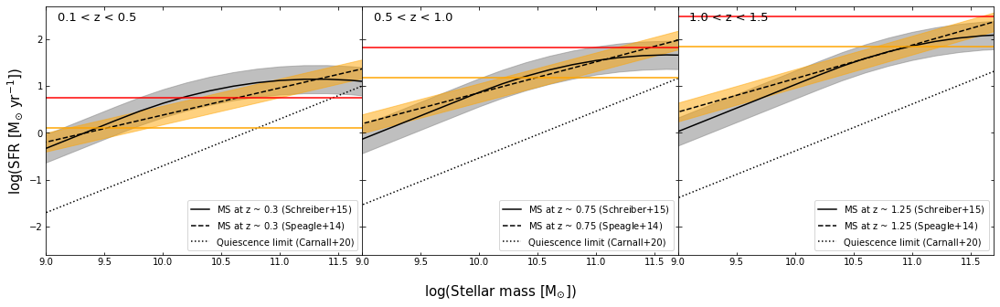

In [54]:
#%% Plotting Star formation rate vs Stellar mass
fig, axs = plt.subplots(1,3,figsize=(15,5), sharey=True)
for i,za,zb,sfr in zip([0,1,2],[0.1,0.5,1.],[0.5,1.,1.5],[fluxes_table['SFR_H_03'],fluxes_table['SFR_H_075'],fluxes_table['SFR_H_125']]):
    z = (za+zb)/2
#    data = results[(results['Median_redshift']>za)&(results['Median_redshift']<=zb)]
#    axs[i].errorbar(data.loc[(data['Type']=='QG'),'Median_mass'],
#                   np.log10(data.loc[(data['Type']=='QG'),'SFR_lofar']),
#                   yerr=data.loc[(data['Type']=='QG'),'SFR_lofar_unc']/(data.loc[(data['Type']=='QG'),'SFR_lofar']*np.log(10)),
#                   fmt='o',mfc='w',mec='r',ms=10,ecolor='r',barsabove=True,capsize=2.5,label='_Quiescent galaxies')
#    axs[i].errorbar(data.loc[(data['Type']=='SFG'),'Median_mass'],
#                   np.log10(data.loc[(data['Type']=='SFG'),'SFR_lofar']),
#                   yerr=data.loc[(data['Type']=='SFG'),'SFR_lofar_unc']/(data.loc[(data['Type']=='SFG'),'SFR_lofar']*np.log(10)),
#                   fmt='s',mfc='w',mec='b',ms=10,ecolor='b',barsabove=True,capsize=2.5,label='_Star-forming galaxies')
    axs[i].plot(m,SchreiberMS(m,z),ls='-', c='k', label=f'MS at z ~ ${z}$ (Schreiber+15)')
    axs[i].fill_between(m,SchreiberMS(m,z)-0.3,SchreiberMS(m,z)+0.3,alpha=0.5,color='grey')
    axs[i].plot([8,13],[SpeagleMS(8,z),SpeagleMS(13,z)],ls='--',color='k',label=f'MS at z ~ ${z}$ (Speagle+14)')
    axs[i].plot([8,13],[CarnallQ(8,z),CarnallQ(13,z)],ls=':',color='k',label=f'Quiescence limit (Carnall+20)')
    axs[i].axhline(np.log10(sfr[1]),c='r')
    axs[i].axhline(np.log10(sfr[4]),c='orange')
    axs[i].fill_between(m,SpeagleMS(m,z)-0.2,SpeagleMS(m,z)+0.2,alpha=0.5,color='orange')
    axs[i].text(9.1,2.4,f'{za} < z < {zb}',size=13,color='k')
    axs[i].set_ylim(ymin=-2.6,ymax=2.7)
    axs[i].set_xlim(xmin=9,xmax=11.7)
    axs[i].tick_params(which='both',top=True,right=True,direction='in')
    axs[i].legend(numpoints=1, loc='lower right')
fig.text(0.5, 0.0,"log(Stellar mass [M$_{\odot}$])", ha='center',fontsize=15)
fig.text(0.0, 0.5,"log(SFR [M$_{\odot}$ yr$^{-1}$])", va='center',fontsize=15, rotation='vertical')
fig.subplots_adjust(left=0.04,right=1,wspace=0)
plt.show()

In [52]:
fluxes_table.to_csv(path+'Bootes_Herschel_depth_'+strftime("%Y-%m-%d",localtime())+'.csv',index=False)